In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import h5py, os, pickle

import tensorflow as tf
tf.config.experimental.set_memory_growth(tf.config.list_physical_devices(device_type="GPU")[0], True)

import numpy as np
import healpy as hp
import matplotlib.pyplot as plt

from tqdm import tqdm
from icecream import ic
from trianglechain import TriangleChain

from msfm.utils import logger, files, scales, power_spectra, parameters, observation

from deep_lss.models.grid_model import GridLossModel
from deep_lss.utils import optimization, configuration
from deep_lss.nets.encoders.cls.mlp import MultiLayerPerceptron

from msi.utils import preprocessing, dataset, input_output

2025-09-02 12:35:21.566570: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-09-02 12:35:21.566606: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-09-02 12:35:21.644213: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-09-02 12:35:21.785485: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-02 12:35:27.087174: W tensorflow/compiler/tf2

# v14

In [3]:
# msfm_conf = files.load_config("/global/homes/a/athomsen/multiprobe-simulation-forward-model/configs/v14/extended.yaml")
# base_dir = "/pscratch/sd/a/athomsen/v11desy3/v14/extended"
# mocks = ["Buzzard"]
# # mocks = ["Buzzard", "Cardinal"]

# out_dir_base = "/pscratch/sd/a/athomsen/run_files/v14"
# # out_dir += "/octant"

### lensing

In [4]:
# with_lensing = True
# with_clustering = False
# with_cross_z = True
# params = ["Om", "s8", "w0", "Aia", "n_Aia", "bta"]
# mocks = []

# label = "8mpc"
# # label = "12mpc"
# dlss_conf = configuration.load_deep_lss_config(
#     f"/global/u2/a/athomsen/y3-deep-lss/configs/v14/lensing/smoothing_fwhm/dlss_{label}.yaml"
# )

### clustering

In [5]:
# with_lensing = False
# with_clustering = True
# with_cross_z = True
# params = ["Om", "s8", "w0", "bg1", "bg2", "bg3", "bg4"]

# # label = "16mpc"
# # label = "20mpc"
# # label = "24mpc"
# # label = "28mpc"
# # label = "32mpc"
# label = "32mpc"
# dlss_conf = configuration.load_deep_lss_config(
#     f"/global/u2/a/athomsen/y3-deep-lss/configs/v14/clustering/smoothing_fwhm/dlss_{label}.yaml"
# )

### combined

In [6]:
# with_lensing = True
# with_clustering = True
# with_cross_z = True
# params = ["Om", "s8", "w0", "Aia", "n_Aia", "bta", "bg1", "bg2", "bg3", "bg4"]
# mocks = []

# label = "8,32mpc"
# dlss_conf = configuration.load_deep_lss_config(
#     f"/global/u2/a/athomsen/y3-deep-lss/configs/v14/combined/dlss_{label}.yaml"
# )

# v15

In [7]:
msfm_conf = files.load_config("/global/homes/a/athomsen/multiprobe-simulation-forward-model/configs/v15/extended.yaml")
base_dir = "/pscratch/sd/a/athomsen/v11desy3/v15/extended"
mocks = ["Buzzard"]

out_dir_base = "/pscratch/sd/a/athomsen/run_files/v15"
label = "default"
# out_dir += "/octant"

### lensing

In [8]:
with_lensing = True
with_clustering = False
with_cross_z = True
params = ["Om", "s8", "w0", "Aia", "n_Aia", "bta"]
mocks = []

dlss_conf = configuration.load_deep_lss_config(
    f"/global/u2/a/athomsen/y3-deep-lss/configs/v15/default/lensing/dlss.yaml"
)

25-09-02 12:35:55 configuratio INF   Loaded the config 


### clustering

In [9]:
# with_lensing = False
# with_clustering = True
# with_cross_z = True
# params = ["Om", "s8", "w0", "bg1", "bg2", "bg3", "bg4"]

# dlss_conf = configuration.load_deep_lss_config(
#     f"/global/u2/a/athomsen/y3-deep-lss/configs/v15/default/clustering/dlss.yaml"
# )

### combined

In [10]:
# with_lensing = True
# with_clustering = True
# with_cross_z = True
# params = ["Om", "s8", "w0", "Aia", "n_Aia", "bta", "bg1", "bg2", "bg3", "bg4"]
# mocks = []

# dlss_conf = configuration.load_deep_lss_config(
#     f"/global/u2/a/athomsen/y3-deep-lss/configs/v15/default/combined/dlss.yaml"
# )

# constants

In [11]:
batch_size = 2**12
shuffle_buffer = 4*batch_size
apply_log = True
standardize = False

cosine_decay = False
# n_steps = 100_000
# n_steps = 200_000
n_steps = 300_000
# n_steps = 400_000
# n_steps = 500_000

out_dir = os.path.join(out_dir_base, "cls/mutual_info")
if with_lensing and not with_clustering:
    out_dir = os.path.join(out_dir, "lensing")
elif with_clustering and not with_lensing:
    out_dir = os.path.join(out_dir, "clustering")
elif with_lensing and with_clustering:
    out_dir = os.path.join(out_dir, "combined")
out_dir = os.path.join(out_dir, f"standard={standardize},log={apply_log},steps={n_steps}")

# label += "_lmin=113" 
    
if label is not None:
    out_dir = os.path.join(out_dir, label)
os.makedirs(out_dir, exist_ok=True)

print("base_dir = ", base_dir)
print("out_dir = ", out_dir)

base_dir =  /pscratch/sd/a/athomsen/v11desy3/v15/extended
out_dir =  /pscratch/sd/a/athomsen/run_files/v15/cls/mutual_info/lensing/standard=False,log=True,steps=300000/default


In [12]:
bins = power_spectra.get_cl_bins(
    msfm_conf["analysis"]["power_spectra"]["l_min"], 
    msfm_conf["analysis"]["power_spectra"]["l_max"], 
    msfm_conf["analysis"]["power_spectra"]["n_bins"]
)
print(bins[-28:])

[ 113.91176687  137.17304172  162.59395706  190.17451288  219.9147092
  251.81454601  285.87402331  322.0931411   360.47189939  401.01029816
  443.70833742  488.56601718  535.58333742  584.76029816  636.09689939
  689.5931411   745.24902331  803.06454601  863.0397092   925.17451288
  989.46895706 1055.92304172 1124.53676687 1195.31013252 1268.24313865
 1343.33578528 1420.58807239 1500.        ]


# white noise dset

25-09-02 12:35:56 configuratio INF   Loaded the config 
25-09-02 12:35:56 preprocessin INF   Using theta_fwhm = [29.5, 20.1, 15.0, 12.6, 130.2, 88.9, 68.1, 57.0] from the dlss config 
25-09-02 12:35:56 preprocessin INF   Using white_noise_sigma = [0.00030275, 0.00040448, 0.00048782, 0.00052049, 0.85135, 0.34375, 0.25989, 0.24127] from the dlss config 
25-09-02 12:35:56 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 12:35:56 preprocessin INF   Using l_mins = [0. 0. 0. 0. 0. 0. 0. 0.] by default (no smoothing) 
25-09-02 12:35:56 preprocessin INF   Using n_bins = 33 from the msfm config 
25-09-02 12:35:56 preprocessin INF   Loading the pre-binned Cls 
25-09-02 12:35:56 input_output INF   Loading summaries from /pscratch/sd/a/athomsen/v11desy3/v15/extended 
25-09-02 12:35:56 input_output INF   Array shapes: 
25-09-02 12:35:56 input_output INF   fiducial/i_example = (

2025-09-02 12:36:21.546866: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38366 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:41:00.0, compute capability: 8.0


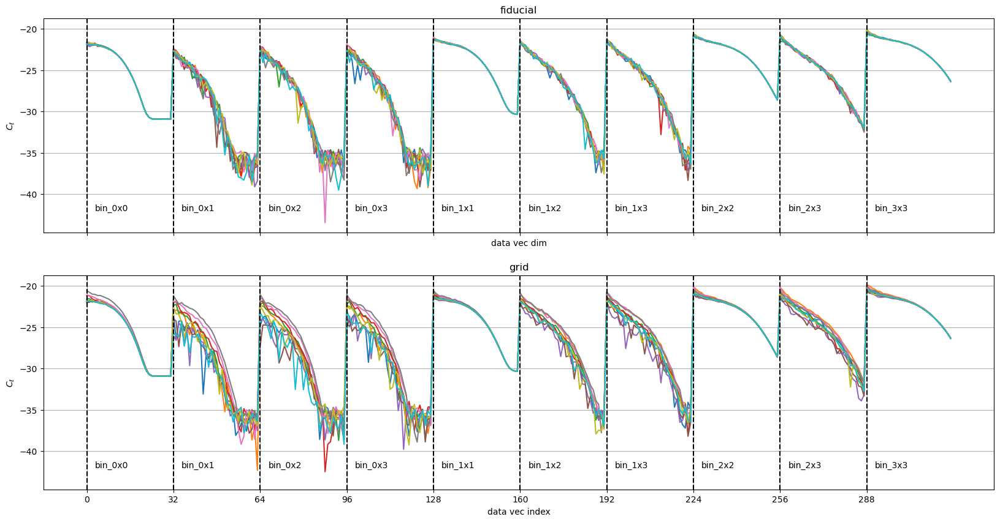

In [13]:
cl_dset_train, cl_dset_test, out_dict = dataset.get_binned_power_spectra_dset(
    base_dir, 
    # configuration
    msfm_conf=msfm_conf,
    dlss_conf=dlss_conf,
    params=params,
    # selection
    with_lensing=with_lensing,
    with_clustering=with_clustering,
    with_cross_z=with_cross_z,
    with_gaussian_noise=True,
    # keep_last_i_bins=28,
    # bin_indices=[bin_index],
    # dset
    batch_size=batch_size,
    shuffle_buffer=shuffle_buffer,
    # smoothing not from the dlss_conf
    # theta_fwhms=theta_fwhm,
    # white_noise_sigmas=white_noise_sigma,
    # cls_from_maps=True,
    # preprocessing
    apply_log=apply_log,
    standardize=standardize,
)

# hard cut dset

In [14]:
# l_mins = 8 * [30]
# l_maxs = [786, 1150, 1535, 1535, 267, 390, 509, 610]

# # def angle_to_ell(angles):
# #     return list(scales.angle_to_ell(np.array(angles), arcmin=True))
# # l_maxs = angle_to_ell([22.1, 15.1, 11.2, 9.4] + [65.1, 44.5, 34.1, 28.5])

# cl_dset_train, cl_dset_test, out_dict, scaler, pca = dataset.get_binned_power_spectra_dset_legacy(
#     base_dir, 
#     # configuration
#     msfm_conf=msfm_conf, 
#     dlss_conf=dlss_conf,
#     params=params,
#     # selection
#     with_lensing=with_lensing,
#     with_clustering=with_clustering,
#     # dset
#     batch_size=batch_size,
#     shuffle_buffer=shuffle_buffer,
#     # power spectra
#     l_mins=l_mins,
#     l_maxs=l_maxs,
#     # n_bins=n_bins,
#     fixed_binning=False,
#     # additional preprocessing
#     apply_log=apply_log,
#     standardize=standardize,
# )

# functions and global constants

In [15]:
n_cls = out_dict["grid/cls/train"].shape[-1]
n_params = len(params)
n_summary = 2 * n_params

num_hidden_units = 1024
# num_hidden_units = 2048
num_layers = 2

dropout_rate = 0.1

def get_cl_summary_network(n_summary=n_summary):
    mlp = MultiLayerPerceptron(
        output_size=n_summary, 
        num_hidden_units=num_hidden_units, 
        num_layers=num_layers, 
        dropout_rate=dropout_rate
    )
    mlp.build((None, n_cls))
    
    return mlp

In [16]:
def train_model(model, eval_every=None):
    do_validation = eval_every is not None
    
    train_losses = []
    train_steps = []
    vali_steps = []
    vali_losses = []
    for i, (cl_batch, cosmo_batch) in tqdm(enumerate(cl_dset_train.take(n_steps+1)), total=n_steps):
        train_losses.append(model.grid_train_step(cl_batch, cosmo_batch))
        train_steps.append(i)
        
        if do_validation and (i % eval_every == 0) and (i !=0):
            vali_loss = []
            for cl_batch, cosmo_batch in cl_dset_test:
                vali_loss.append(model.vali_loss_fn(model(cl_batch, training=False), cosmo_batch))
            vali_losses.append(np.mean(vali_loss))
            vali_steps.append(i)

    fig, ax = plt.subplots()
    ax.plot(train_steps[100:], train_losses[100:], label="training")
    ax.plot(vali_steps, vali_losses, label="validation")
    ax.legend()
    
    if do_validation:
        print(f"final validation loss = {vali_losses[-1]}")
        
    model.save_model()

# variational lower bound

In [17]:
learning_rate = 1e-4

summary_net = get_cl_summary_network()

if cosine_decay:
    lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
        initial_learning_rate=learning_rate, decay_steps=n_steps, alpha=0.0
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
else:
    optimizer = tf.keras.optimizers.Adam(learning_rate)
    
model = GridLossModel(
    summary_net,
    n_side=None,
    indices=None,
    optimizer=optimizer,
    checkpoint_dir=os.path.join(out_dir, "model"),
    # restore_checkpoint=True,
    restore_checkpoint=False,
)

# model.restore_model_from_checkpoint_path(
#     os.path.join(out_dir, "model", f"ckpt-{checkpoint_number}")
# )

model.setup_grid_loss_step(
    batch_size=batch_size,
    dim_theta=n_params,
    loss="mutual_info",
    dim_x=n_cls,
    dim_summary=n_summary,
    mutual_info_estimator="variational",
    clip_by_global_norm=1.0,
    mutual_info_kwargs={"full_covariance": False},
)

25-09-02 12:36:23 base_model.p INF   Initializing with a normal Sequential model 
25-09-02 12:36:23 base_model.p INF   The network is initialized from scratch. 
25-09-02 12:36:23 grid_model.p INF   Initialized the GridLossModel 
25-09-02 12:36:24 grid_model.p WAR   Mutual info loss, overwriting the checkpoint manager 
25-09-02 12:36:24 grid_model.p WAR   Using the mutual information loss with the variational estimator 
25-09-02 12:36:24 grid_model.p INF   Set up the training step of the mutual_info loss 


  0%|          | 0/300000 [00:00<?, ?it/s]

25-09-02 12:36:25 grid_model.p WAR   Tracing grid_train_step 
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module, class, method, function, traceback, frame, or code object was expected, got cython_function_or_method
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
25-09-02 12:36:27 base_model.p WAR   Performing a base_train_step in python instead of a tf.function 
25-09-02 12:36:28 grid_model.p WAR   Tracing grid_train_step 
25-09-02 12:36:28 base_model.p W

2025-09-02 12:36:28.896356: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8903
2025-09-02 12:36:30.929274: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fd0c7721db0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-09-02 12:36:30.929292: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A100-SXM4-40GB, Compute Capability 8.0
2025-09-02 12:36:30.936033: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1756841791.032446 1440731 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
300001it [1:39:29, 50.25it/s]                              


final validation loss = -0.40882810950279236
25-09-02 14:16:03 base_model.p INF   Successfully saved the model in /pscratch/sd/a/athomsen/run_files/v15/cls/mutual_info/lensing/standard=False,log=True,steps=300000/default/model 


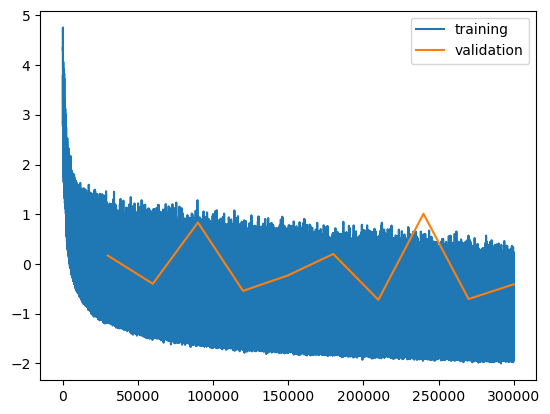

In [18]:
train_model(model, eval_every=n_steps//10)

# save the results

In [19]:
# n_steps = 100_000
# out_dir = os.path.join(out_dir, "cls/mutual_info", f"lensing={with_lensing},clustering={with_clustering},standard={standardize},log={apply_log},cosine={cosine_decay},steps={n_steps}", "8,32mpc")
# os.makedirs(out_dir, exist_ok=True)
# print(out_dir)

In [20]:
# pred_file = os.path.join(out_dir, "preds.h5")
# print("pred_file", pred_file)

In [21]:
fidu_preds = model(out_dict["fidu/cls"], training=False)
grid_preds = model(out_dict["grid/cls/test"], training=False)

pred_file = os.path.join(out_dir, "preds.h5")
with h5py.File(pred_file, "w") as f:
    f.create_dataset(name="grid/preds/test", data=grid_preds)
    f.create_dataset(name="grid/cosmos/test", data=out_dict["grid/cosmos/test"])
    f.create_dataset(name="fidu/preds", data=fidu_preds)

print(f"Wrote to {pred_file}\n")
print(fidu_preds)

Wrote to /pscratch/sd/a/athomsen/run_files/v15/cls/mutual_info/lensing/standard=False,log=True,steps=300000/default/preds.h5

tf.Tensor(
[[ 0.23391026  0.08756068  0.32468146 ... -0.26962757 -0.00087088
   0.06573696]
 [ 0.14430721  0.08259748  0.3556601  ... -0.37824175 -0.02204065
   0.11950764]
 [ 0.1298568   0.14376307  0.24991667 ... -0.20215587  0.03248607
   0.00086029]
 ...
 [ 0.23966442  0.05406902  0.47630292 ... -0.24472293  0.09186715
   0.07979804]
 [ 0.16323584  0.19448575  0.32123345 ... -0.29705495  0.03996064
   0.01528268]
 [ 0.20452788  0.09163847  0.4211924  ... -0.28807697  0.10479388
   0.06540024]], shape=(40000, 12), dtype=float32)


In [22]:
out_dict["fidu/cls"].shape

(40000, 320)

# external mocks

In [23]:
n_side = msfm_conf["analysis"]["n_side"]
n_pix = msfm_conf["analysis"]["n_pix"]
data_vec_pix = files.load_pixel_file(msfm_conf)[0]
hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

i_rand = np.random.randint(0, grid_preds.shape[0], 100)

def evaluate_mock(out_label, lensing_file=None, clustering_file=None, nest_in=False, plot_diagnostics=False):
    # load the mock
    if lensing_file is not None:
        with h5py.File(lensing_file, "r") as f_in:
            gamma1 = []
            gamma2 = []
            for j in range(1,5):
                gamma1.append(f_in[f"metacal/raw_gamma1_bin{j}"])
                gamma2.append(f_in[f"metacal/raw_gamma2_bin{j}"])
            gamma1 = np.stack(gamma1, axis=-1)
            gamma2 = np.stack(gamma2, axis=-1)
            
            wl_map = np.stack([gamma1, gamma2], axis=-1)

        if plot_diagnostics:
            hp.mollview(gamma1[:,0], nest=nest_in, title="input gamma1")
            hp.mollview(gamma2[:,0], nest=nest_in, title="input gamma2")
    else:
        wl_map = np.zeros((n_pix,4,2))

    if clustering_file is not None:
        with h5py.File(clustering_file, "r") as f_in:
            gc_map = []
            for i in range(1,5):
                gc_map.append(f_in[f"maglim/galaxy_counts_bin{i}"][:])
            gc_map = np.stack(gc_map, axis=-1)

        if plot_diagnostics:
            hp.mollview(gc_map[:,0], nest=nest_in, title="input galaxy counts")
    else:
        gc_map = np.zeros((n_pix,4))

    # forward model
    obs_cl = preprocessing.get_preprocessed_cl_observation(
        wl_gamma_map=wl_map,
        gc_count_map=gc_map,
        # configuration
        msfm_conf=msfm_conf,
        dlss_conf=dlss_conf,
        base_dir=base_dir,
        nest_in=False,
        # selection
        with_lensing=with_lensing,
        with_clustering=with_clustering,
        with_cross_z=with_cross_z,
        with_cross_probe=(with_lensing and with_clustering),
        # additional preprocessing
        apply_log=apply_log,
        standardize=standardize,
        # obs_label=out_label,
    )    

    # evaluate
    obs_pred = model(obs_cl, training=False)
    print(out_label, ": obs_pred =", obs_pred)

    if plot_diagnostics:
        tri = TriangleChain()
        tri.scatter(
            np.array(grid_preds)[i_rand], 
            scatter_kwargs={"s": 10, "marker": "o"}
        )
        tri.scatter(
            np.array(obs_pred), 
            scatter_kwargs={"s": 500, "marker": "*"},
            color="k"
        )
        fig, ax = plt.subplots()
        ax.plot(out_dict["grid/cls/test"][i_rand,:].T, alpha=0.5)
        ax.plot(np.squeeze(obs_cl), alpha=1, color="k", linestyle=":")
        ax.legend(loc="best")
        ax.set(xlabel="data vec dim", ylabel=r"$C_\ell$")

    # save
    with h5py.File(pred_file, "a") as f_out:
        if out_label in f_out:
            del f_out[out_label]
        f_out.create_dataset(name=out_label, data=obs_pred)


## Buzzard

### lensing

In [24]:
with h5py.File(pred_file, "r") as f:
    print(f.keys())

<KeysViewHDF5 ['fidu', 'grid']>


25-09-02 14:16:05 configuratio INF   Loaded the config 
25-09-02 14:16:05 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:16:05 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:16:16 preprocessin INF   Adding white noise to the observation 
25-09-02 14:16:16 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:16:16 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_0 : obs_pred = tf.Tensor(
[[ 0.28094006  0.11759344  0.3551211   0.09258759 -0.08336173 -0.4491438
  -0.07040682 -0.09210392 -0.12442999 -0.11311494  0.06783833 -0.00875067]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:16:19 configuratio INF   Loaded the config 
25-09-02 14:16:19 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:16:19 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:16:29 preprocessin INF   Adding white noise to the observation 
25-09-02 14:16:29 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:16:29 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_2 : obs_pred = tf.Tensor(
[[ 0.0974056   0.0477094   0.17584468 -0.01984586  0.03089684 -0.34102505
   0.10866933 -0.23728281 -0.14514746 -0.24681154  0.17634338 -0.09001666]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:16:32 configuratio INF   Loaded the config 
25-09-02 14:16:32 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:16:32 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:16:42 preprocessin INF   Adding white noise to the observation 
25-09-02 14:16:42 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:16:42 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_3 : obs_pred = tf.Tensor(
[[ 0.15771277  0.0650114   0.2700649  -0.04729853 -0.10450222 -0.36235547
   0.18781379 -0.2931774   0.04301642 -0.18574338  0.11044917 -0.0198145 ]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:16:45 configuratio INF   Loaded the config 
25-09-02 14:16:45 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:16:45 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:16:56 preprocessin INF   Adding white noise to the observation 
25-09-02 14:16:56 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:16:56 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_4 : obs_pred = tf.Tensor(
[[ 0.15317589  0.15678573  0.37892884  0.09679691 -0.02253966 -0.28438237
   0.04956362 -0.11553733 -0.15117979 -0.24932352  0.16104294  0.03282797]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:16:59 configuratio INF   Loaded the config 
25-09-02 14:16:59 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:16:59 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:06 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:06 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:06 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_5 : obs_pred = tf.Tensor(
[[ 0.18606535  0.04263023  0.1471089   0.01340963 -0.0124471  -0.39694595
   0.05386267 -0.24939054 -0.11619622 -0.18233818  0.05666573 -0.05149838]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:09 configuratio INF   Loaded the config 
25-09-02 14:17:09 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:09 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:15 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:15 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:15 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_6 : obs_pred = tf.Tensor(
[[ 0.18366346  0.07403335  0.21476479  0.05181456 -0.07770593 -0.4714761
   0.12429263 -0.21158265  0.10536685 -0.21174943  0.02720393  0.02162494]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:17 configuratio INF   Loaded the config 
25-09-02 14:17:17 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:17 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:24 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:24 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:24 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_7 : obs_pred = tf.Tensor(
[[ 0.21732502  0.09131126  0.233959    0.14971793 -0.04945974 -0.40930772
   0.04078868 -0.16161656 -0.10851065 -0.20031217  0.1810422  -0.0317199 ]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:27 configuratio INF   Loaded the config 
25-09-02 14:17:27 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:27 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:33 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:33 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:33 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_8 : obs_pred = tf.Tensor(
[[ 0.08997826  0.09162868  0.27240428 -0.16396725 -0.00254862 -0.36377403
   0.18832746 -0.19499698 -0.02176384 -0.20281777  0.01347023 -0.0347333 ]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:35 configuratio INF   Loaded the config 
25-09-02 14:17:35 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:35 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:42 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:42 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:42 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_9 : obs_pred = tf.Tensor(
[[ 0.07304524  0.14725628  0.486111   -0.08682593  0.01632495 -0.1788567
   0.09128007 -0.12540549 -0.15533592 -0.26172242  0.14835642  0.03941113]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:45 configuratio INF   Loaded the config 
25-09-02 14:17:45 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:45 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:17:51 preprocessin INF   Adding white noise to the observation 
25-09-02 14:17:51 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:17:51 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_10 : obs_pred = tf.Tensor(
[[ 0.20034651  0.18223296  0.29399803  0.0028343  -0.02881722 -0.35265186
   0.08356126 -0.18022987 -0.05348784 -0.18489774  0.04133663  0.02271407]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:17:53 configuratio INF   Loaded the config 
25-09-02 14:17:53 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:17:53 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:18:00 preprocessin INF   Adding white noise to the observation 
25-09-02 14:18:00 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:18:00 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_11 : obs_pred = tf.Tensor(
[[ 0.11654538  0.19859783  0.49237394 -0.02419907 -0.07050411 -0.2724239
   0.14871916 -0.06822066 -0.03279423 -0.26612732  0.10886581  0.06285831]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:18:04 configuratio INF   Loaded the config 
25-09-02 14:18:04 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:18:04 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:18:10 preprocessin INF   Adding white noise to the observation 
25-09-02 14:18:10 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:18:10 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_12 : obs_pred = tf.Tensor(
[[ 0.14611733  0.22958438  0.4443353  -0.05287931 -0.20075516 -0.25095138
   0.13931718 -0.25143975 -0.01608123 -0.289385    0.02409388  0.06456104]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:18:12 configuratio INF   Loaded the config 
25-09-02 14:18:12 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:18:12 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:18:18 preprocessin INF   Adding white noise to the observation 
25-09-02 14:18:18 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:18:18 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_13 : obs_pred = tf.Tensor(
[[ 0.07367168  0.20497863  0.45574886 -0.09255669  0.01229657 -0.26243326
   0.12685382 -0.14078239 -0.10738442 -0.30745375  0.04994612  0.08461143]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:18:20 configuratio INF   Loaded the config 
25-09-02 14:18:20 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:18:20 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:18:27 preprocessin INF   Adding white noise to the observation 
25-09-02 14:18:27 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:18:27 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_14 : obs_pred = tf.Tensor(
[[ 0.1858778   0.10754068  0.21688423  0.19117072 -0.0698943  -0.59294367
   0.16548035 -0.12336824 -0.0374191  -0.10871118  0.10283898 -0.022158  ]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


25-09-02 14:18:31 configuratio INF   Loaded the config 
25-09-02 14:18:31 preprocessin INF   Using l_maxs = [366.10169492 537.31343284 720.         857.14285714  82.94930876
 121.4848144  158.59030837 189.47368421] from the dlss config 
25-09-02 14:18:31 preprocessin INF   Using l_mins = [0 0 0 0 0 0 0 0] by default (no smoothing) 
25-09-02 14:18:38 preprocessin INF   Adding white noise to the observation 
25-09-02 14:18:38 preprocessin INF   Using the bin indices [ 0  1  2  3  8  9 10 15 16 21] 
25-09-02 14:18:38 preprocessin INF   Taking the logarithm of the absolute values. 
mocks/pred/Buzzard_15 : obs_pred = tf.Tensor(
[[ 0.301397    0.06779747  0.39590904 -0.01990048 -0.11269863 -0.24788731
  -0.08474687 -0.12014738 -0.11731959 -0.171969    0.11186455 -0.00605291]], shape=(1, 12), dtype=float32)


  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


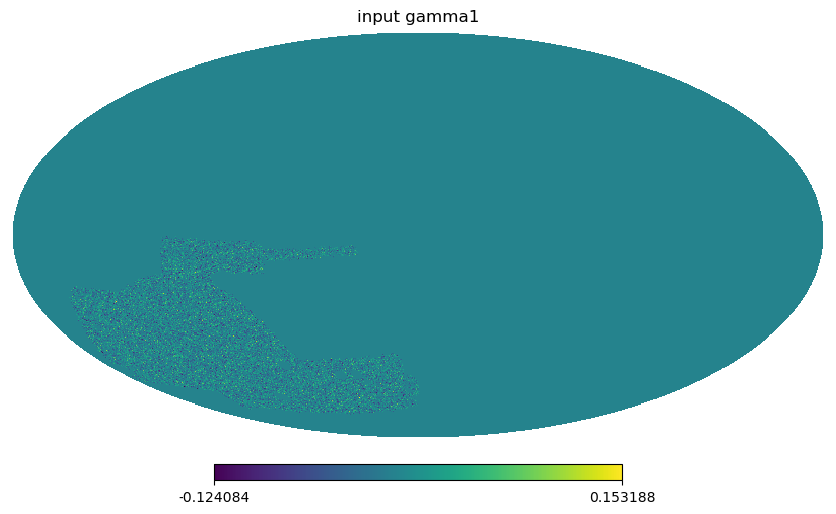

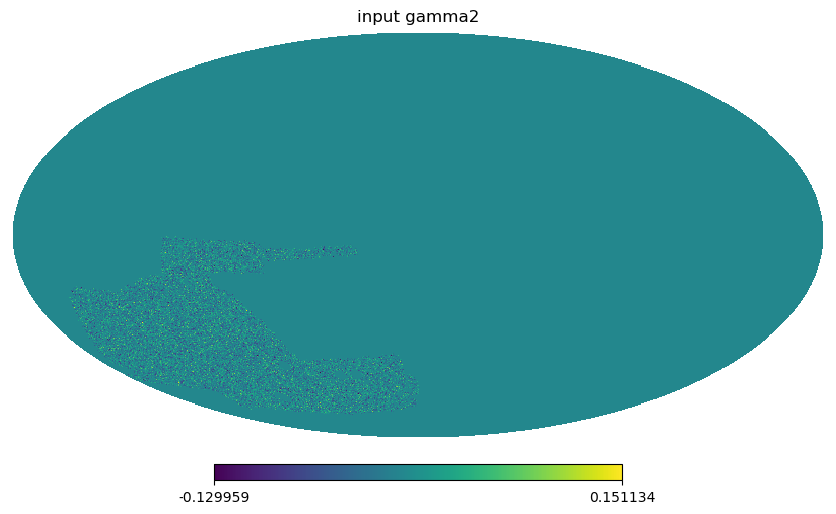

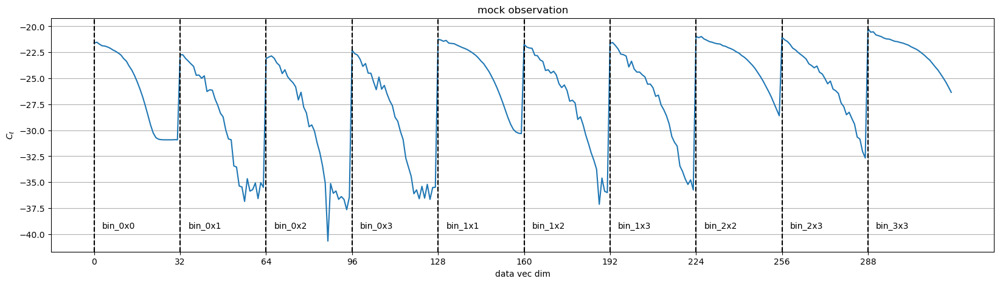

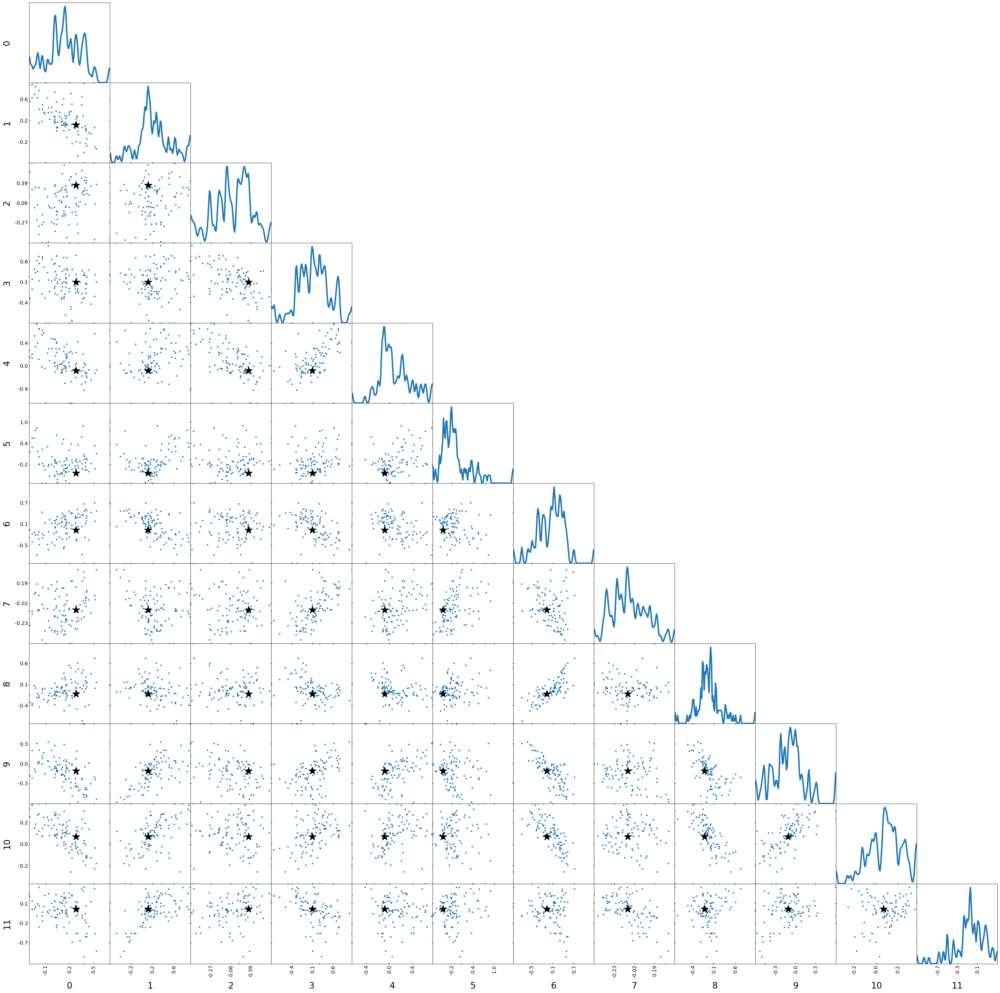

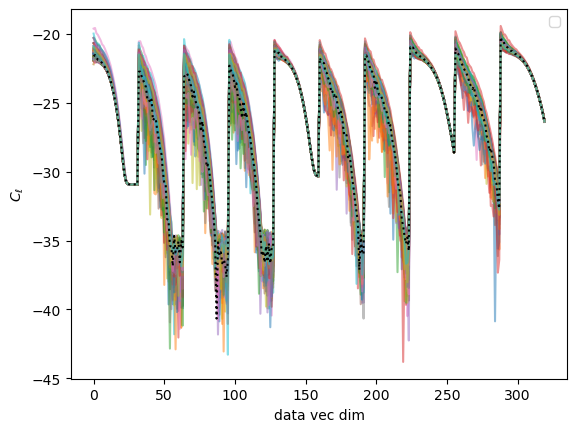

...

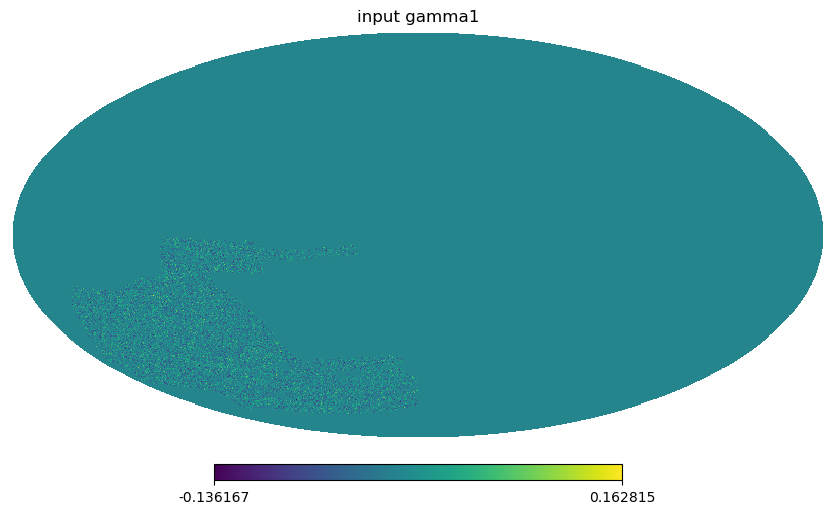

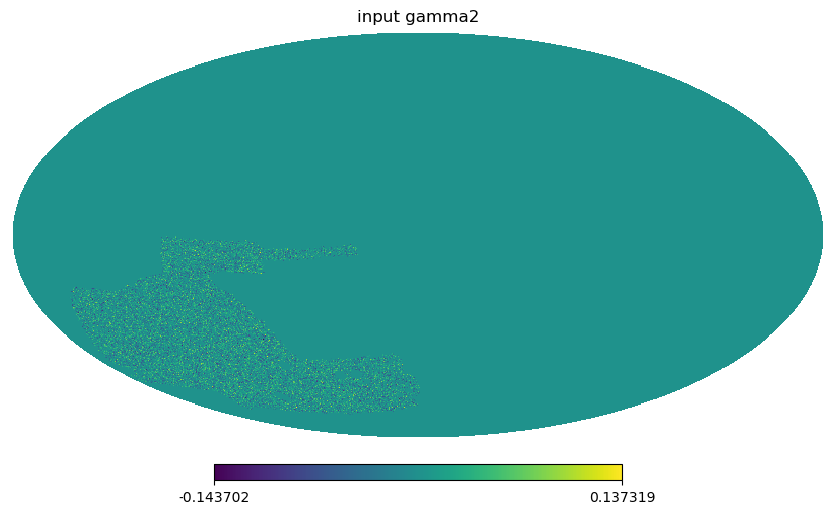

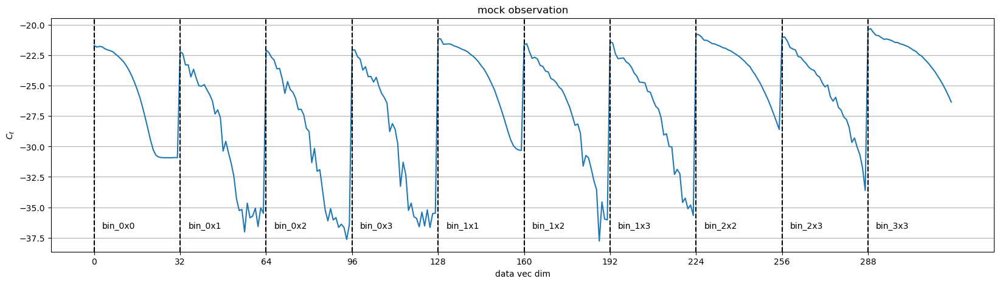

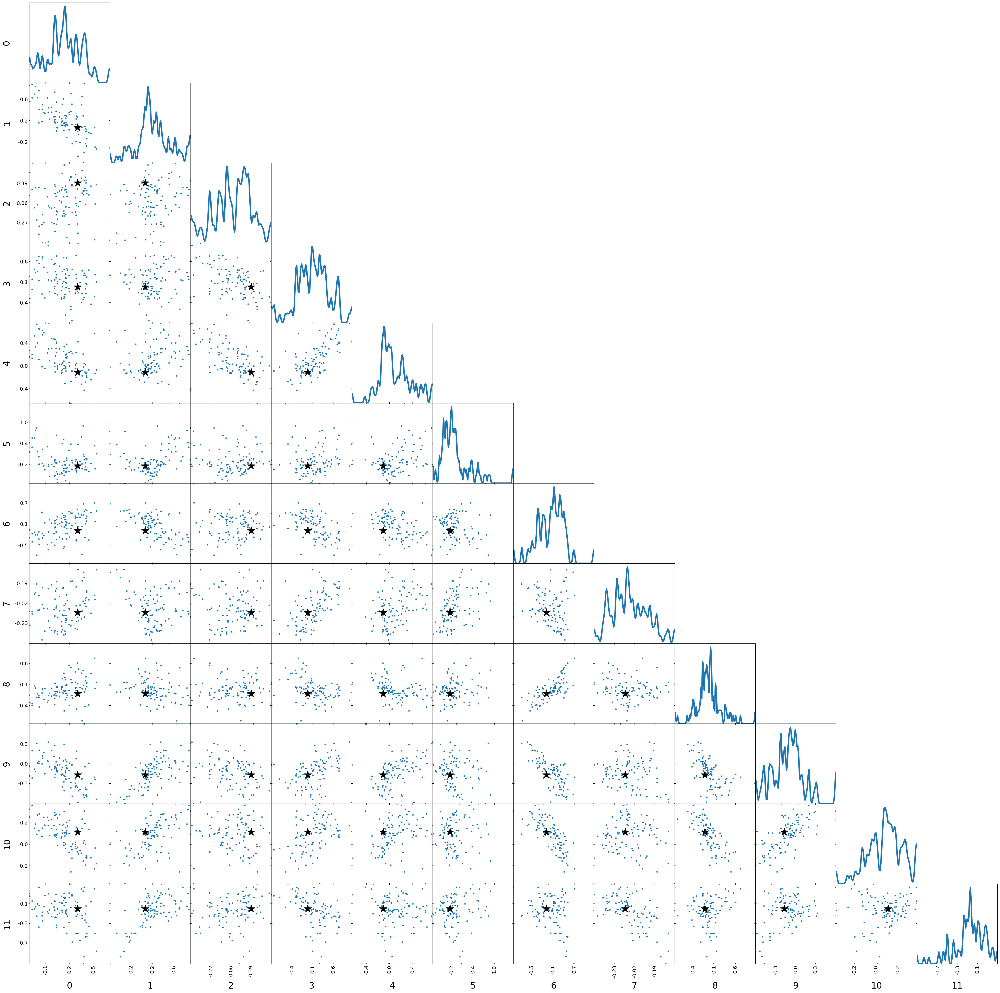

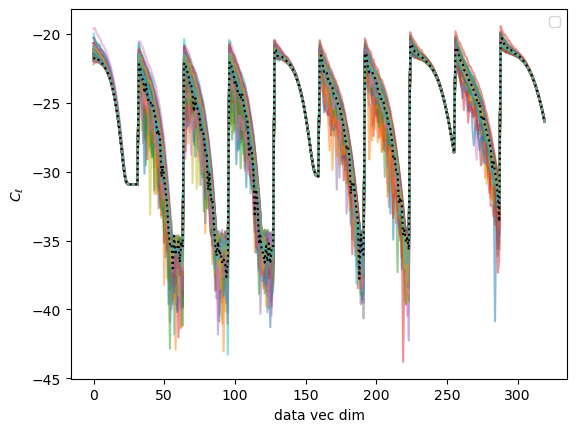

In [25]:
if with_lensing and not with_clustering:    
    buzzard_indices = list(range(0, 16))
    buzzard_indices.remove(1)
    for i in buzzard_indices:
        out_label = f"mocks/pred/Buzzard_{i}"
        lensing_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"
        
        evaluate_mock(
            out_label, 
            lensing_file=lensing_file, 
            nest_in=False, 
            plot_diagnostics=True
        )

### clustering

In [26]:
if not with_lensing and with_clustering:    
    I = [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
    J = [0, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 11, 11]
    K = ["a"] + 7 * ["a", "b"]

    # for i in buzzard_indices:
    for i, j, k in zip(I, J, K):
        out_label = f"mocks/pred/Buzzard_{i}"
        clustering_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_Buzzard_{j}_Y3{k}.h5"
        
        evaluate_mock(
            out_label, 
            clustering_file=clustering_file, 
            nest_in=False, 
            plot_diagnostics=True
        )

### combined

In [27]:
if with_lensing and with_clustering:
    I = [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
    J = [0, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 11, 11]
    K = ["a"] + 7 * ["a", "b"]
    for i, j, k in zip(I, J, K):
        out_label = f"mocks/pred/Buzzard_{i}"
        lensing_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"
        clustering_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_Buzzard_{j}_Y3{k}.h5"
        evaluate_mock(
            out_label, 
            lensing_file=lensing_file, 
            clustering_file=clustering_file,
            nest_in=False, 
            plot_diagnostics=False
        )

In [28]:
stop

NameError: name 'stop' is not defined

# plotting

In [ ]:
n_side = msfm_conf["analysis"]["n_side"]
n_pix = msfm_conf["analysis"]["n_pix"]
data_vec_pix = files.load_pixel_file(msfm_conf)[0]
hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

i_rand = np.random.randint(0, grid_preds.shape[0], 100)

def get_obs_cls(out_label, lensing_file=None, clustering_file=None, nest_in=False):
    # load the mock
    if lensing_file is not None:
        with h5py.File(lensing_file, "r") as f_in:
            gamma1 = []
            gamma2 = []
            for j in range(1,5):
                gamma1.append(f_in[f"metacal/raw_gamma1_bin{j}"])
                gamma2.append(f_in[f"metacal/raw_gamma2_bin{j}"])
            gamma1 = np.stack(gamma1, axis=-1)
            gamma2 = np.stack(gamma2, axis=-1)
            
            wl_map = np.stack([gamma1, gamma2], axis=-1)
    else:
        wl_map = np.zeros((n_pix,4,2))

    if clustering_file is not None:
        with h5py.File(clustering_file, "r") as f_in:
            gc_map = []
            for i in range(1,5):
                gc_map.append(f_in[f"maglim/galaxy_counts_bin{i}"][:])
            gc_map = np.stack(gc_map, axis=-1)
    else:
        gc_map = np.zeros((n_pix,4))

    # forward model
    obs_cl = preprocessing.get_preprocessed_cl_observation(
        wl_gamma_map=wl_map,
        gc_count_map=gc_map,
        # configuration
        msfm_conf=msfm_conf,
        dlss_conf=dlss_conf,
        base_dir=base_dir,
        nest_in=False,
        # selection
        with_lensing=with_lensing,
        with_clustering=with_clustering,
        # with_cross_z=with_cross_z,
        # with_cross_probe=(with_lensing and with_clustering),
        with_cross_z=False,
        with_cross_probe=False,
        # additional preprocessing
        apply_log=apply_log,
        standardize=standardize,
        # obs_label=out_label,
        make_plot=False,
    )    

    return obs_cl

In [ ]:
flock_cls = []
I = [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
J = [0, 3, 3, 4, 4, 5, 5, 6, 6, 7, 7, 8, 8, 11, 11]
K = ["a"] + 7 * ["a", "b"]
for i, j, k in zip(I, J, K):
    out_label = f"mocks/pred/Buzzard_{i}"
    lensing_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"
    clustering_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_Buzzard_{j}_Y3{k}.h5"
    obs_cls = get_obs_cls(
        out_label, 
        lensing_file=lensing_file, 
        clustering_file=clustering_file,
        nest_in=False
)
    flock_cls.append(obs_cls)
flock_cls = np.stack(flock_cls, axis=0)

In [ ]:
from msfm.utils import cross_statistics

In [ ]:
flock_cls = np.squeeze(flock_cls)
flock_cls.shape

In [ ]:
bin_size=msfm_conf["analysis"]["power_spectra"]["n_bins"] - 1
_, bin_names = cross_statistics.get_cross_bin_indices(
    with_lensing=with_lensing,
    with_clustering=with_clustering,
    # with_cross_z=with_cross_z,
    # with_cross_probe=True,
    with_cross_z=False,
    with_cross_probe=False,
)

fig, ax = plt.subplots(figsize=(20, 10), sharex=True, nrows=2)

buzzard_indices = list(range(0, 15))
buzzard_indices.remove(1)
# buzzard_indices = [0]
for i in range(len(buzzard_indices)):
    mock = f"Buzzard_{buzzard_indices[i]}"

    ax[0].plot(flock_cls[i])
    ax[1].plot(flock_cls[i]/np.mean(flock_cls, axis=0) - 1)

ax[0].grid(True)
ax[1].grid(True)
ax[0].set(
    title="mock observation", xscale="linear", ylabel=r"$C_\ell$", ylim=(-35, -5)
)
ax[1].set(
     xlabel="data vec dim", ylabel=r"$\frac{C_\ell}{\bar{C}_\ell} - 1$", ylim=(-0.05, 0.05)
)

# cosmetics
if bin_size is not None:
    x = 0
    ticks = []
    for i, x in enumerate(np.arange(0, len(bin_names) * bin_size, bin_size)):
        ax[0].axvline(x, color="k", linestyle="--")
        ax[1].axvline(x, color="k", linestyle="--")
        ax[0].text(x + 3, 0.1, bin_names[i][4:], transform=ax[0].get_xaxis_transform())
        ticks.append(x)

    ax[1].set_xticks(ticks)

fig.savefig("./plots/Buzzards_auto.png", bbox_inches="tight", dpi=100)


In [ ]:
bin_size=msfm_conf["analysis"]["power_spectra"]["n_bins"] - 1
_, bin_names = cross_statistics.get_cross_bin_indices(
    with_lensing=with_lensing,
    with_clustering=with_clustering,
    with_cross_z=False,
    with_cross_probe=False,
    # with_cross_z=with_cross_z,
    # with_cross_probe=True,
)

buzzard_indices = list(range(0, 15))
buzzard_indices.remove(1)
# buzzard_indices = [0]
for i in range(len(buzzard_indices)):
    mock = f"Buzzard_{buzzard_indices[i]}"
    
    fig, ax = plt.subplots(figsize=(20, 10), sharex=True, nrows=2)

    ax[0].plot(flock_cls[i])
    ax[1].plot(flock_cls[i]/np.mean(flock_cls, axis=0) - 1)

    ax[0].grid(True)
    ax[1].grid(True)
    ax[0].set(
        title=mock, xscale="linear", ylabel=r"$C_\ell$", ylim=(-35, -5)
    )
    ax[1].set(
         xlabel="data vec dim", ylabel=r"$\frac{C_\ell}{\bar{C}_\ell} - 1$", ylim=(-0.05, 0.05)
    )

    # cosmetics
    if bin_size is not None:
        x = 0
        ticks = []
        for i, x in enumerate(np.arange(0, len(bin_names) * bin_size, bin_size)):
            ax[0].axvline(x, color="k", linestyle="--")
            ax[1].axvline(x, color="k", linestyle="--")
            ax[0].text(x + 3, 0.1, bin_names[i][4:], transform=ax[0].get_xaxis_transform())
            ticks.append(x)

        ax[1].set_xticks(ticks)

    fig.savefig("./plots/" + mock + "_auto.png", bbox_inches="tight", dpi=100)


# internal mocks

In [ ]:
# clustering_file = "/pscratch/sd/j/jbucko/DESY3/v13/linear_bias/clustering/maps/maps_for_compression_v13_clustering_True_lensing_False_grid_cosmo.pkl"
# with open(clustering_file, 'rb') as f:
#     jozef_maps = pickle.load(f)

# n_side = msfm_conf["analysis"]["n_side"]
# n_pix = msfm_conf["analysis"]["n_pix"]
# data_vec_pix = files.load_pixel_file(msfm_conf)[0]
# hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

# for i in range(jozef_maps.shape[0]):
#     for j in range(jozef_maps.shape[1]):
#         gc_map = jozef_maps[i,j]
        
#         obs_cl = preprocessing.get_preprocessed_cl_observation(
#             wl_gamma_map=np.zeros((n_pix,4,2)),
#             gc_count_map=gc_map,
#             # configuration
#             msfm_conf=msfm_conf,
#             dlss_conf=dlss_conf,
#             base_dir=base_dir,
#             from_raw_cls=False,
#             # selection
#             with_lensing=with_lensing,
#             with_clustering=with_clustering,
#             with_cross_z=with_cross_z,
#             with_cross_probe=(with_lensing and with_clustering),
#             # bin_indices=[bin_index],
#             # additional preprocessing
#             apply_log=apply_log,
#             # standardize=standardize,
#             # scaler=scaler,
#             # pca_components=None,
#             # pca=pca,
#         )
        
#         print(obs_cl.shape)
        

In [ ]:
# import pickle

# lensing_file = "/pscratch/sd/j/jbucko/DESY3/v13/linear_bias/lensing/maps/maps_for_compression_v13_clustering_False_lensing_True_grid_cosmo.pkl"
# with open(lensing_file, 'rb') as f:
#     data = pickle.load(f)

# print(data.shape)

In [ ]:
# n_side = msfm_conf["analysis"]["n_side"]
# n_pix = msfm_conf["analysis"]["n_pix"]
# data_vec_pix = files.load_pixel_file(msfm_conf)[0]
# hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

# with h5py.File(pred_file, "a") as f_out:
#     for obs_label in mocks:
#         obs_file = f"/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/mock_observations/DESY3_mock_observation_{obs_label}.h5"

#         with h5py.File(obs_file, "r") as f_in:
#             gc_map = []
#             for i in range(1,5):
#                 gc_map.append(f_in[f"maglim/galaxy_counts_bin{i}"][:])
#             gc_map = np.stack(gc_map, axis=-1)

#         obs_cl = preprocessing.get_preprocessed_cl_observation(
#             wl_gamma_map=np.zeros((n_pix,4,2)),
#             gc_count_map=gc_map,
#             # configuration
#             msfm_conf=msfm_conf,
#             dlss_conf=dlss_conf,
#             base_dir=base_dir,
#             from_raw_cls=False,
#             # selection
#             with_lensing=with_lensing,
#             with_clustering=with_clustering,
#             with_cross_z=with_cross_z,
#             with_cross_probe=(with_lensing and with_clustering),
#             # bin_indices=[bin_index],
#             # additional preprocessing
#             apply_log=apply_log,
#             # standardize=standardize,
#             # scaler=scaler,
#             # pca_components=None,
#             # pca=pca,
#         )
        
#         fig, ax = plt.subplots()
#         ax.plot(out_dict["fidu/cls"][0,:], label="fiducial", alpha=0.5)
#         ax.plot(np.squeeze(obs_cl), label=obs_label, alpha=0.5)
#         ax.legend(loc="best")
#         ax.set(xlabel="data vec dim", ylabel=r"$C_\ell$", title=obs_label)

#         obs_pred = model(obs_cl)
#         print("\n", obs_label, obs_pred, "\n")
            
#         f_out.create_dataset(name=f"mocks/{obs_label}", data=obs_pred)


# OLD

In [ ]:
# # buzzard_lensing_file = "/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/0/DESY3_mock_observation_buzzard_0_from_g1g2.h5"
# # buzzard_lensing_file = "/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/0/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"

# i = 0
# buzzard_lensing_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"

# with h5py.File(buzzard_lensing_file, "r") as f_in:
#     gamma1 = []
#     gamma2 = []
#     for i in range(1,5):
#         gamma1.append(f_in[f"metacal/raw_gamma1_bin{i}"])
#         gamma2.append(f_in[f"metacal/raw_gamma2_bin{i}"])
#     gamma1 = np.stack(gamma1, axis=-1)
#     gamma2 = np.stack(gamma2, axis=-1)
    
#     wl_map = np.stack([gamma1, gamma2], axis=-1)

# nest_in = False
# # hp.mollview(gamma1[:,0], nest=nest_in, title="input gamma1")
# # hp.mollview(gamma2[:,0], nest=nest_in, title="input gamma2")

# obs, obs_cls, data_vec_pix = observation.forward_model_observation_map(
#     wl_gamma_map=wl_map,
#     conf=msfm_conf,
#     apply_norm=False,
#     with_padding=True,
#     nest_in=nest_in,
# )

# n_pix = msfm_conf["analysis"]["n_pix"]
# obs_map = np.zeros((n_pix, obs.shape[-1]))
# obs_map[data_vec_pix] = obs
# hp.mollview(obs_map[:,0], nest=True, title="output data vector")

### multiple Buzzards

In [ ]:
# n_side = msfm_conf["analysis"]["n_side"]
# n_pix = msfm_conf["analysis"]["n_pix"]
# data_vec_pix = files.load_pixel_file(msfm_conf)[0]
# hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

# i_rand = np.random.randint(0, grid_preds.shape[0], 100)

# buzzard_indices = list(range(0, 15))
# buzzard_indices.remove(1)

# for i in buzzard_indices:
#     obs_label = f"Buzzard_{i}"
#     buzzard_lensing_file = f"/pscratch/sd/j/jbucko/DESY3/mock_observations/lensing/buzzard_flock/{i}/DESY3_mock_observation_buzzard_flock_v14_shear_noise+WL.h5"
    
#     with h5py.File(buzzard_lensing_file, "r") as f_in:
#         gamma1 = []
#         gamma2 = []
#         for i in range(1,5):
#             gamma1.append(f_in[f"metacal/raw_gamma1_bin{i}"])
#             gamma2.append(f_in[f"metacal/raw_gamma2_bin{i}"])
#         gamma1 = np.stack(gamma1, axis=-1)
#         gamma2 = np.stack(gamma2, axis=-1)
        
#         wl_map = np.stack([gamma1, gamma2], axis=-1)

#     # get rid of underflows/hp.UNSEEN
#     wl_map = np.where(wl_map < -10, 0.0, wl_map)
    
#     obs_cl = preprocessing.get_preprocessed_cl_observation(
#         wl_gamma_map=wl_map,
#         gc_count_map=np.zeros((n_pix,4)),
#         # configuration
#         msfm_conf=msfm_conf,
#         dlss_conf=dlss_conf,
#         base_dir=base_dir,
#         nest_in=False,
#         # selection
#         with_lensing=with_lensing,
#         with_clustering=with_clustering,
#         with_cross_z=with_cross_z,
#         with_cross_probe=(with_lensing and with_clustering),
#         # additional preprocessing
#         apply_log=apply_log,
#         standardize=standardize,
#     )    

#     obs_pred = model(obs_cl)
#     print("\n", obs_label, obs_pred, "\n")

#     with h5py.File(pred_file, "a") as f_out:
#         out_label = f"mocks/pred/{obs_label}" 
#         if out_label in f_out:
#             del f_out[out_label]
#         f_out.create_dataset(name=out_label, data=obs_pred)

#     # debug
#     fig, ax = plt.subplots()
#     # ax.plot(out_dict["grid/cls/test"][0,:], label="grid 0", alpha=0.5)
#     ax.plot(out_dict["grid/cls/test"][i_rand,:].T, alpha=0.5)
#     ax.plot(np.squeeze(obs_cl), label=obs_label, alpha=1.0, color="k", linestyle=":")
#     ax.legend(loc="best")
#     ax.set(xlabel="data vec dim", ylabel=r"$C_\ell$")
    
#     tri = TriangleChain()
#     tri.scatter(
#         np.array(grid_preds)[i_rand], 
#         scatter_kwargs={"s": 10, "marker": "o"}
#     )
#     tri.scatter(
#         np.array(obs_pred), 
#         scatter_kwargs={"s": 500, "marker": "*"},
#         color="k"
#     )


### clustering

In [ ]:
# n_side = msfm_conf["analysis"]["n_side"]
# n_pix = msfm_conf["analysis"]["n_pix"]
# data_vec_pix = files.load_pixel_file(msfm_conf)[0]
# hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

# with h5py.File(pred_file, "a") as f_out:
#     for obs_label in mocks:
#         obs_file = f"/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/mock_observations/DESY3_mock_observation_{obs_label}.h5"

#         with h5py.File(obs_file, "r") as f_in:
#             gc_map = []
#             for i in range(1,5):
#                 gc_map.append(f_in[f"maglim/galaxy_counts_bin{i}"][:])
#             gc_map = np.stack(gc_map, axis=-1)

#         obs_cl = preprocessing.get_preprocessed_cl_observation(
#             wl_gamma_map=np.zeros((n_pix,4,2)),
#             gc_count_map=gc_map,
#             # configuration
#             msfm_conf=msfm_conf,
#             dlss_conf=dlss_conf,
#             base_dir=base_dir,
#             from_raw_cls=False,
#             # selection
#             with_lensing=with_lensing,
#             with_clustering=with_clustering,
#             with_cross_z=with_cross_z,
#             with_cross_probe=(with_lensing and with_clustering),
#             # bin_indices=[bin_index],
#             # additional preprocessing
#             apply_log=apply_log,
#             # standardize=standardize,
#             # scaler=scaler,
#             # pca_components=None,
#             # pca=pca,
#         )
        
#         fig, ax = plt.subplots()
#         ax.plot(out_dict["fidu/cls"][0,:], label="fiducial", alpha=0.5)
#         ax.plot(np.squeeze(obs_cl), label=obs_label, alpha=0.5)
#         ax.legend(loc="best")
#         ax.set(xlabel="data vec dim", ylabel=r"$C_\ell$", title=obs_label)

#         obs_pred = model(obs_cl)
#         print("\n", obs_label, obs_pred, "\n")
            
#         f_out.create_dataset(name=f"mocks/{obs_label}", data=obs_pred)


### Buzzard flock

In [ ]:
# n_side = msfm_conf["analysis"]["n_side"]
# n_pix = msfm_conf["analysis"]["n_pix"]
# data_vec_pix = files.load_pixel_file(msfm_conf)[0]
# hp_datapath = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/healpy_data"

# buzzard_flock_dir = "/global/u2/a/athomsen/multiprobe-simulation-forward-model/data/mock_observations/Buzzard_flock"
# buzzard_flock_files = os.listdir(buzzard_flock_dir)

# with h5py.File(pred_file, "a") as f_out:
#     for buzzard_flock_file in buzzard_flock_files:
#         obs_file = os.path.join(buzzard_flock_dir, buzzard_flock_file)
#         obs_label = buzzard_flock_file[23:-3]
    
#         with h5py.File(obs_file, "r") as f_in:
#             gc_map = []
#             for i in range(1,5):
#                 gc_map.append(f_in[f"maglim/galaxy_counts_bin{i}"][:])
#             gc_map = np.stack(gc_map, axis=-1)

#         obs_cl = preprocessing.get_preprocessed_cl_observation(
#             wl_gamma_map=np.zeros((n_pix,4,2)),
#             gc_count_map=gc_map,
#             # configuration
#             msfm_conf=msfm_conf,
#             dlss_conf=dlss_conf,
#             base_dir=base_dir,
#             from_raw_cls=False,
#             # selection
#             with_lensing=with_lensing,
#             with_clustering=with_clustering,
#             with_cross_z=with_cross_z,
#             with_cross_probe=(with_lensing and with_clustering),
#             # bin_indices=[bin_index],
#             # additional preprocessing
#             apply_log=apply_log,
#             # standardize=standardize,
#             # scaler=scaler,
#             # pca_components=None,
#             # pca=pca,
#         )
        
#         fig, ax = plt.subplots()
#         ax.plot(out_dict["fidu/cls"][0,:], label="fiducial", alpha=0.5)
#         ax.plot(np.squeeze(obs_cl), label=obs_label, alpha=0.5)
#         ax.legend(loc="best")
#         ax.set(xlabel="data vec dim", ylabel=r"$C_\ell$", title=obs_label)

#         obs_pred = model(obs_cl)
#         print("\n", obs_label, obs_pred, "\n")
            
#         # f_out.create_dataset(name=f"mocks/{obs_label}", data=obs_pred)

#         out_label = f"mocks/pred/{obs_label}" 
#         if out_label in f_out:
#             del f_out[out_label]
#         f_out.create_dataset(name=out_label, data=obs_pred)



# OLD

In [ ]:
import tensorflow as tf

# Create an example dataset
dataset = tf.data.Dataset.range(20)

# Define n (the interval between elements you want to keep)
n = 5

# Filter to take every nth element
filtered_dataset = dataset.enumerate().filter(lambda i, x: i % n == 0).map(lambda i, x: x)

# Print the result
for element in filtered_dataset:
    print(element.numpy())
